## Using the KNN/SVM model classifier to do face recognition

In [4]:
import math
from sklearn import neighbors
import os
import os.path
import pickle
from PIL import Image, ImageDraw, ImageFont
import face_recognition
from face_recognition.face_recognition_cli import image_files_in_folder

ALLOWED_EXTENSIONS = {'png', 'jpg', 'jpeg'}

### 1. Extract face embeddings from the train directory

In [5]:
train_dir = "data/train"
X = []
y = []

for class_dir in os.listdir(train_dir):
    if not os.path.isdir(os.path.join(train_dir, class_dir)):
        continue

    print("Processing face for: ", class_dir, end="")
    for img_path in image_files_in_folder(os.path.join(train_dir, class_dir)):
        image = face_recognition.load_image_file(img_path)
        face_bounding_boxes = face_recognition.face_locations(image)

        # If there are no people (or too many people) in a training image, skip the image.
        if len(face_bounding_boxes) != 1:
            print("{} skipped: {}".format(img_path, "No face" if len(face_bounding_boxes) < 1 else ">1 face"))
        else:
            X.append(face_recognition.face_encodings(image, known_face_locations=face_bounding_boxes)[0])
            y.append(class_dir)
            print("+", end="")
    print("Done")

print("Face embedding extraction complete! Total {} pictures.".format(len(X)))

Processing face for:  Barack Obama++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++Done
Processing face for:  Bill Gates+++Done
Processing face for:  Donald Trump++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++Done
Processing face for:  Joe Biden++Done
Processing face for:  Larry Page+++Done
Processing face for:  Mark Zuckerberg+++Done
Face embedding extraction complete! Total 351 pictures.


### 3. Analyze and visualize the faces by using 3D PCA

In [7]:
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d import proj3d

import matplotlib.pyplot as plt
plt.rcParams['axes.unicode_minus']=False
plt.rcParams['font.family'] = 'monospace'

X_obama = []
X_gates = []
X_trump = []
X_biden = []
X_page = []
X_zuckerberg = []

for i in range(0, 138):
    X_obama.append(X[i])
for i in range(138, 141):
    X_gates.append(X[i])
for i in range(141, 343):
    X_trump.append(X[i])
for i in range(343, 345):
    X_biden.append(X[i])
for i in range(345, 348):
    X_page.append(X[i])
for i in range(348, 351):
    X_zuckerberg.append(X[i])

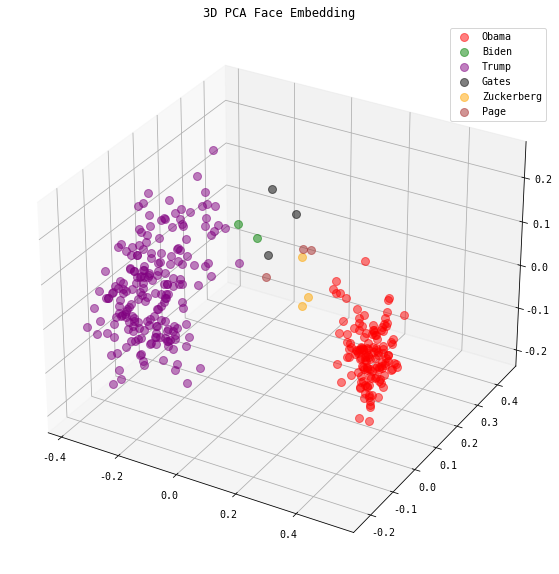

In [8]:
pca = PCA(n_components=3).fit(X)
Xd_page = pca.transform(X_page)
Xd_zuckerberg = pca.transform(X_zuckerberg)
Xd_gates = pca.transform(X_gates)
Xd_obama = pca.transform(X_obama)
Xd_biden = pca.transform(X_biden)
Xd_trump = pca.transform(X_trump)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.rcParams['legend.fontsize'] = 10   
ax.plot(Xd_obama[:,0], Xd_obama[:,1], Xd_obama[:,2],
        'o', markersize=8, color='red', alpha=0.5, label='Obama')
ax.plot(Xd_biden[:,0], Xd_biden[:,1], Xd_biden[:,2],
        'o', markersize=8, color='green', alpha=0.5, label='Biden')
ax.plot(Xd_trump[:,0], Xd_trump[:,1], Xd_trump[:,2],
        'o', markersize=8, color='purple', alpha=0.5, label='Trump')
ax.plot(Xd_gates[:,0], Xd_gates[:,1], Xd_gates[:,2],
        'o', markersize=8, color='black', alpha=0.5, label='Gates')
ax.plot(Xd_zuckerberg[:,0], Xd_zuckerberg[:,1], Xd_zuckerberg[:,2],
        'o', markersize=8, color='orange', alpha=0.5, label='Zuckerberg')
ax.plot(Xd_page[:,0], Xd_page[:,1], Xd_page[:,2],
        'o', markersize=8, color='brown', alpha=0.5, label='Page')

plt.title('3D PCA Face Embedding')
ax.legend(loc='upper right')

plt.show()

### 3. Train a KNN classifier by using face embedding array

In [9]:
n_neighbors = 2

if n_neighbors is None:
    n_neighbors = int(round(math.sqrt(len(X))))
knn_clf = neighbors.KNeighborsClassifier(n_neighbors=n_neighbors, algorithm='ball_tree', weights='distance')
knn_clf.fit(X, y)
with open('./knn_model_trained.clf', 'wb') as f:
    pickle.dump(knn_clf, f)

### 4. train a SVM classifier by using face embedding array

In [10]:
from sklearn import svm

svm_clf = svm.SVC(gamma='scale')
svm_clf.fit(X, y)

with open('./svm_model_trained.clf', 'wb') as f:
    pickle.dump(svm_clf, f)

### 5. Test

In [12]:
test_image = face_recognition.load_image_file('data/00.jpg')

face_locations = face_recognition.face_locations(test_image)
no = len(face_locations)
print("Number of faces detected: ", no)

print("Found:")
for i in range(no):
    test_image_enc = face_recognition.face_encodings(test_image)[i]
    name = knn_clf.predict([test_image_enc])
    print(*name)

Number of faces detected:  1
Found:
Donald Trump


### 6. Face detection

In [13]:
def predict(X_img_path, model_path=None, distance_threshold=0.6):
    with open(model_path, 'rb') as f:
        model_clf = pickle.load(f)

    X_img = face_recognition.load_image_file(X_img_path)
    X_face_locations = face_recognition.face_locations(X_img)
    if len(X_face_locations) == 0:
        return []

    faces_encodings = face_recognition.face_encodings(X_img, known_face_locations=X_face_locations)
    closest_distances = model_clf.kneighbors(faces_encodings, n_neighbors=2)
    are_matches = [closest_distances[0][i][0] <= distance_threshold for i in range(len(X_face_locations))]

    # Predict classes and remove classifications that aren't within the threshold
    return [(pred, loc) if rec else ("unknown", loc) for pred, loc, rec in zip(model_clf.predict(faces_encodings), X_face_locations, are_matches)]

Looking for faces in 00.jpg
- Found Barack Obama at (63, 63)


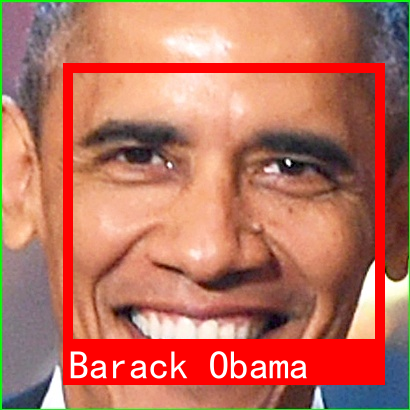

Looking for faces in 01.jpg
- Found Barack Obama at (18, 43)


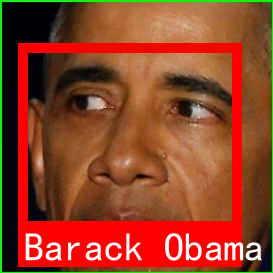

Looking for faces in 02.jpg
- Found Donald Trump at (418, 461)


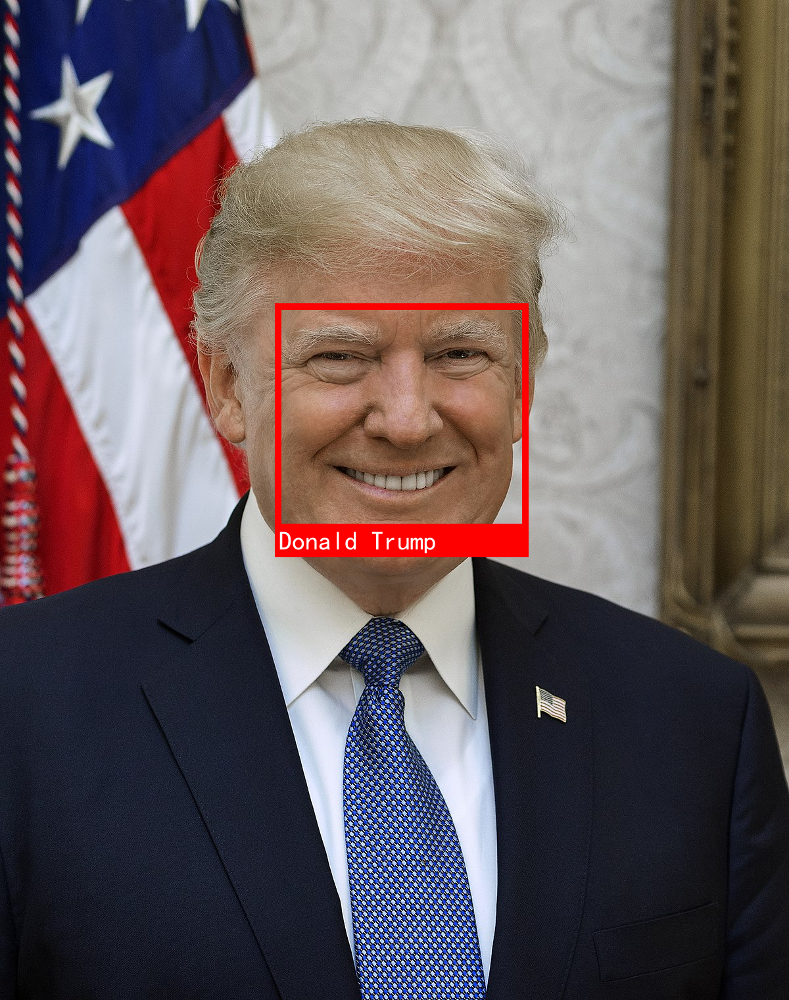

Looking for faces in 03.jpg
- Found Bill Gates at (115, 133)


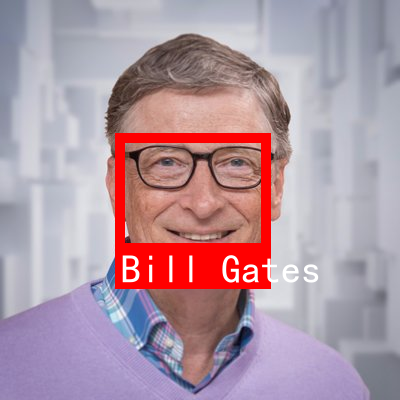

Looking for faces in 04.jpg
- Found Donald Trump at (22, 52)


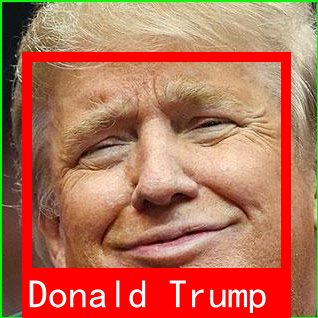

Looking for faces in 05.jpg
- Found Joe Biden at (451, 297)


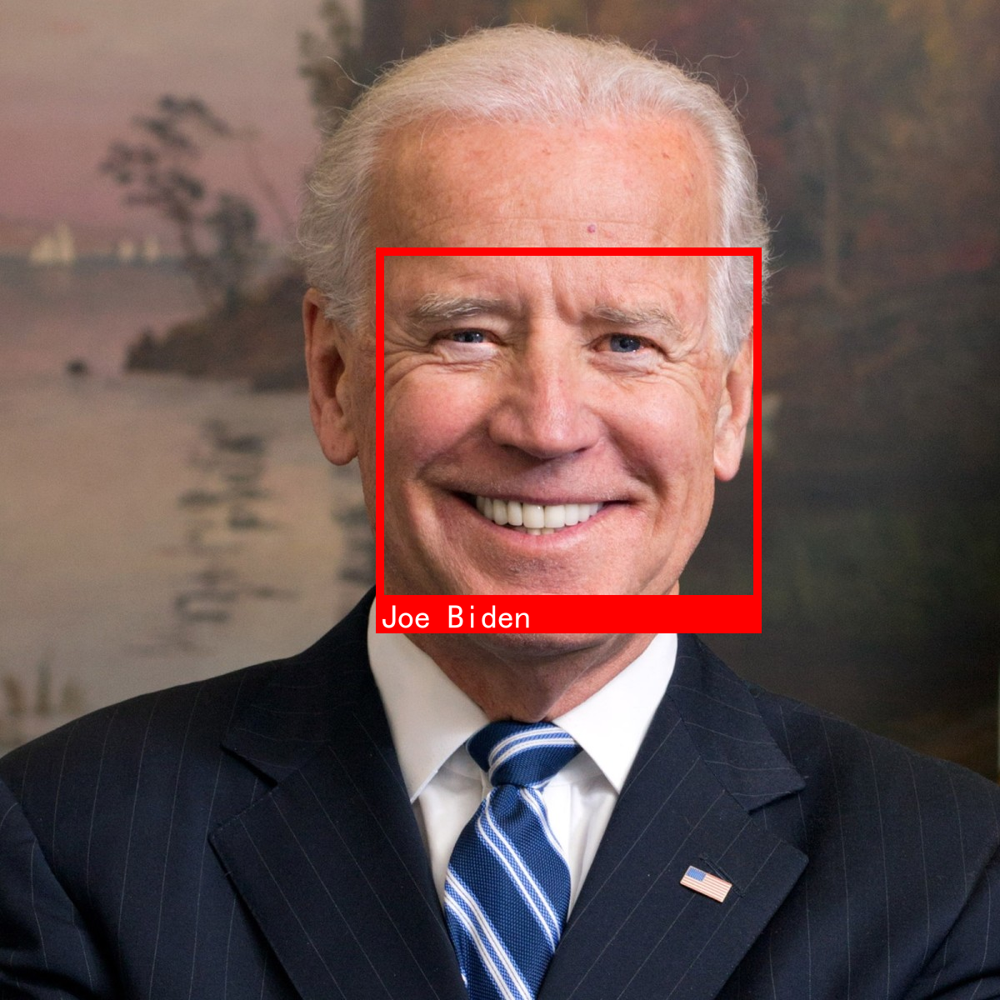

Looking for faces in 06.jpg
- Found Joe Biden at (419, 241)


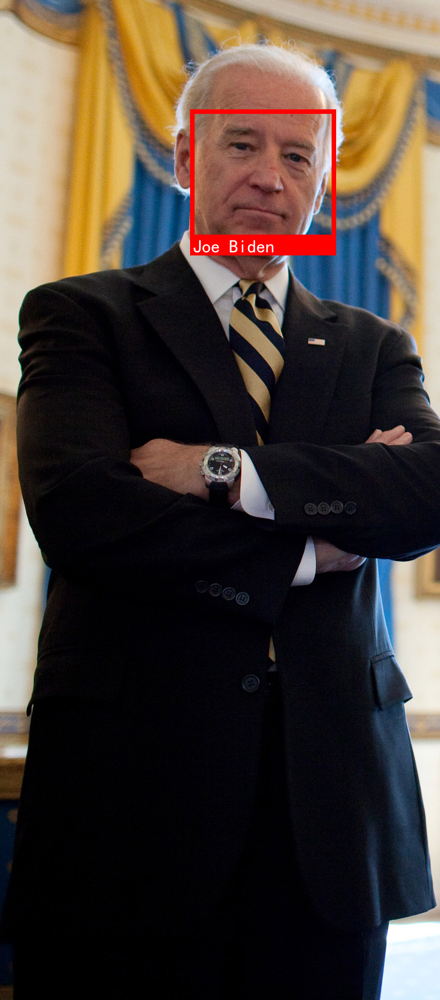

Looking for faces in 07.jpg
- Found Larry Page at (191, 142)


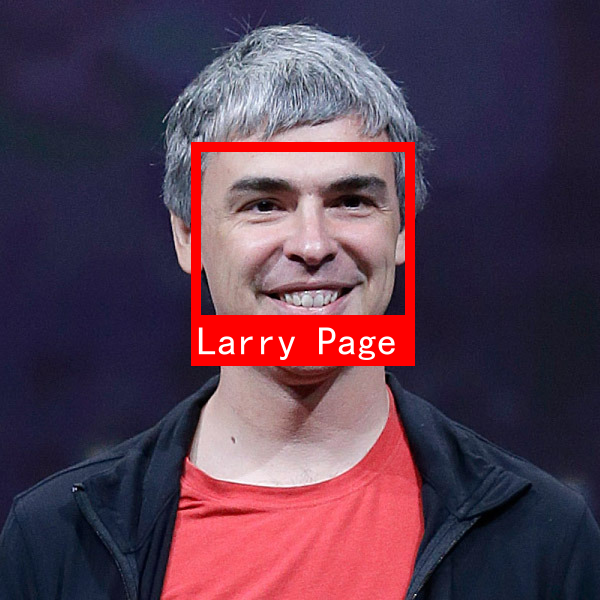

Looking for faces in 08.jpg
- Found Mark Zuckerberg at (66, 36)


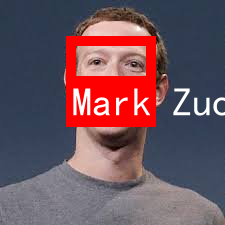

Looking for faces in 09.jpg
- Found Mark Zuckerberg at (872, 280)


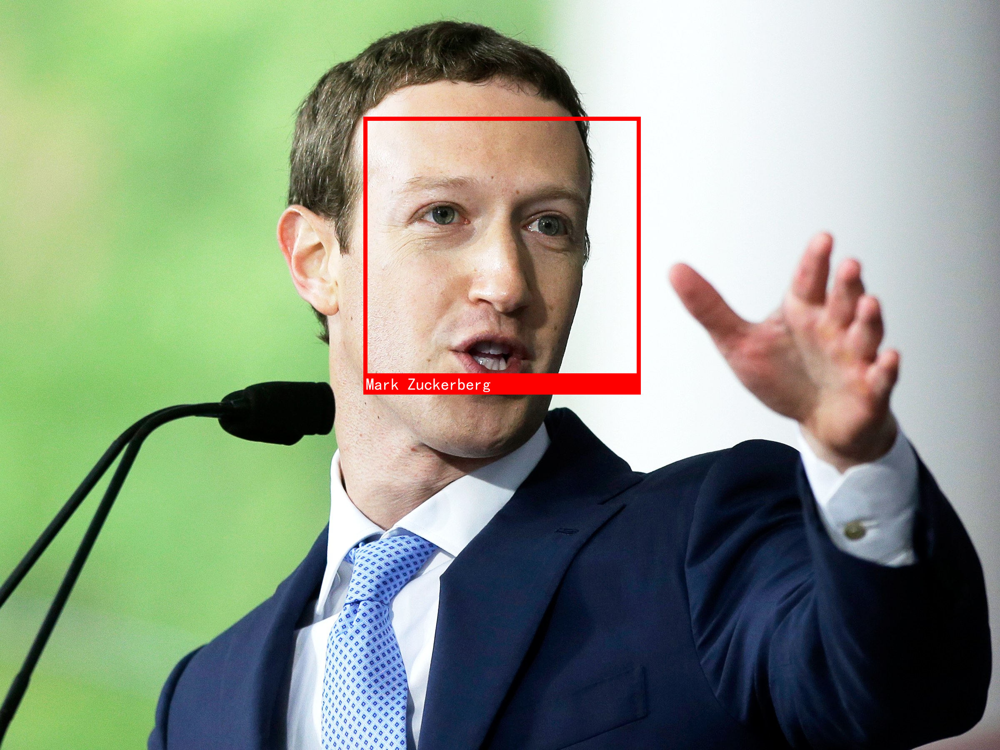

In [15]:
image_dir = 'data/images/'
for image_file in os.listdir(image_dir):
    if image_file.endswith((".jpg", ".png")):
        full_file_path = os.path.join(image_dir, image_file)
        print("Looking for faces in {}".format(image_file))

        predictions = predict(full_file_path, model_path="./knn_model_trained.clf")

        for name, (top, right, bottom, left) in predictions:
            print("- Found {} at ({}, {})".format(name, left, top))

        pil_image = Image.open(os.path.join(image_dir, image_file)).convert("RGB")
        draw = ImageDraw.Draw(pil_image)
        
        for name, (top, right, bottom, left) in predictions:
            draw.rectangle(((left, top), (right, bottom)), outline=(255, 0, 0), width=10)
            fnt = ImageFont.truetype("simhei.ttf", 40)
            text_width, text_height = draw.textsize(name, font = fnt)
            draw.rectangle(((left, bottom - text_height - 10), (right, bottom)), fill=(255, 0, 0), outline=(255, 0, 0), width=5)
            draw.text((left + 6, bottom - text_height - 5), name, font = fnt, fill=(255, 255, 255, 255))
            
        del draw
        display(pil_image)